In [35]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np



Abtastrate: 22050, Signal-Länge: 94.08 Sekunden


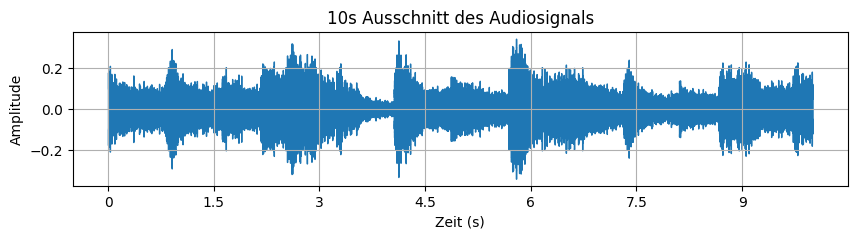

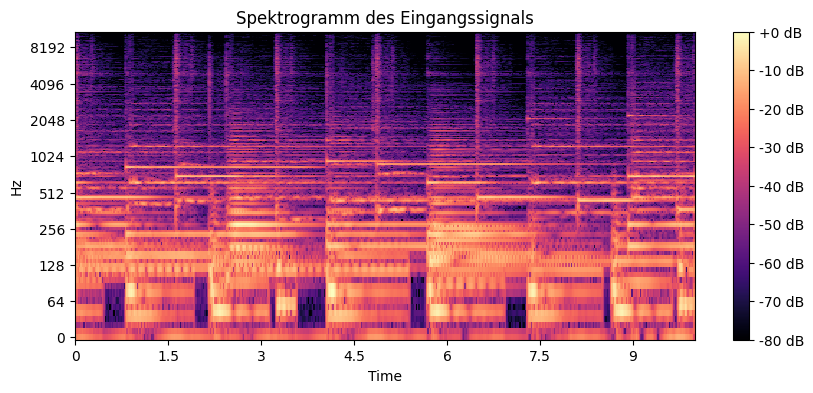

In [36]:
#1. Lesen Sie Ihr Musikstück mit *librosa* ein und 
# ermittlen Sie die Abtrastrate. Wählen Sie einen 
# geeigneten 10s-Ausschnitt und stellen Sie diesen 
# als Kurve und als Spektrogramm dar.


# Demo-Audio laden
y, sr = librosa.load('thesound.wav')
print(f"Abtastrate: {sr}, Signal-Länge: {len(y)/sr:.2f} Sekunden")

# 10 Sekunden auswählen (z.B. ab Sekunde 30)
start = int(sr * 30)
end = start + int(sr * 10)
y_clip = y[start:end]

# Zeitreihe plotten
plt.figure(figsize=(10, 2))
librosa.display.waveshow(y_clip, sr=sr)
plt.title("10s Ausschnitt des Audiosignals")
plt.xlabel("Zeit (s)")
plt.ylabel("Amplitude")
plt.grid()
plt.show()

# Spektrogramm berechnen und darstellen
D = librosa.amplitude_to_db(np.abs(librosa.stft(y_clip)), ref=np.max)
plt.figure(figsize=(10, 4))
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.title("Spektrogramm des Eingangssignals")
plt.colorbar(format='%+2.0f dB')
plt.show()

In [46]:
#2. Zerlegen Sie Ihr Signal in Blöcke der 
# Länge 1024.

block_size = 1024

# Anzahl kompletter Blöcke berechnen
num_blocks = len(y) // block_size

# Signal auf ein Vielfaches von 1024 kürzen (Rest abschneiden)
y = y[:num_blocks * block_size]

# Signal in Blöcke aufteilen (2D-Array: num_blocks x block_size)
blocks = y.reshape((num_blocks, block_size))



In [38]:
#3. Tieftöner haben typischerweise einen 
# Frequenzbereich von 30 Hz – 600 Hz, Mitteltöner 
# 300 Hz – 5.000 Hz und Hochtöner 2.000 Hz – 20.000 Hz.
#  Wählen Sie eine geeignete Grenzfrequenz für 
# einen Tiefpass zur Ansteuerung des Tieftöners 
# und für einen Hochpass zur Ansteuerung des 
# Hochtöners und rechnen Sie diese in die 
# zugehörige Wellenzahl um. Der Bandpass zur 
# Ansteuerung des Mitteltöners liegt folglich 
# zwischen diesen beiden Grenzfrequenzen.

# Beispielwerte
f_low = 600       # Grenzfrequenz für Tiefpass (Hz)
f_high = 2000     # Grenzfrequenz für Hochpass (Hz)

# Samplingrate und Blockgröße (angenommen, diese hast du schon definiert)
# sr = Abtastrate (z.B. 22050)
# block_size = 1024

# Umrechnung von Frequenz in FFT-Bin-Index
k_low = int(f_low / sr * block_size)
k_high = int(f_high / sr * block_size)

print(f"FFT-Index für 600 Hz: {k_low}")
print(f"FFT-Index für 2000 Hz: {k_high}")



FFT-Index für 600 Hz: 27
FFT-Index für 2000 Hz: 92


In [39]:
#4. Implementieren drei FFT-Filter: 
# (1) einen idealen Tiefpass; 
# (2) einen idealen Bandpass; 
# (3) einen idealen Hochpass. 
# Dies geschieht durch einfaches Nullsetzen aller 
# Frequenzen im Sperrbereich und Beibehaltung des 
# Spektrums im Durchlassbereich für jeden 1024er-Block. 
# Achten Sie darauf, dass das FFT-Spektrum 
# spiegelsymmetrisch ist, d.h. z.B. bei einem Hochpass müssen Sie das 
# Spektrum für alle Frequenzen von 0 bis zur 
# Grenzwellenzahl $k$ auf Null setzen, aber auch 
# für alle Frequenzen von $N-k$ bis $N-1$.

def apply_fft_filter(blocks, k_low, k_high, filter_type):
    filtered_blocks = []

    for block in blocks:
        spectrum = np.fft.fft(block)

        if filter_type == "lowpass":
            spectrum[k_low+1:-k_low] = 0
        elif filter_type == "bandpass":
            spectrum[:k_low] = 0
            spectrum[k_high+1:-k_high] = 0
            spectrum[-k_low:] = 0
        elif filter_type == "highpass":
            spectrum[:k_high] = 0
            spectrum[-k_high+1:] = 0

        filtered_block = np.fft.ifft(spectrum).real
        filtered_blocks.append(filtered_block)

    return np.concatenate(filtered_blocks)


In [40]:
#5. Filtern Sie Ihr Signal mit allen drei Filtern 
# und stellen das Ergebnis als Spektrogramme dar.

lowpass_signal = apply_fft_filter(blocks, k_low, k_high, "lowpass")
bandpass_signal = apply_fft_filter(blocks, k_low, k_high, "bandpass")
highpass_signal = apply_fft_filter(blocks, k_low, k_high, "highpass")


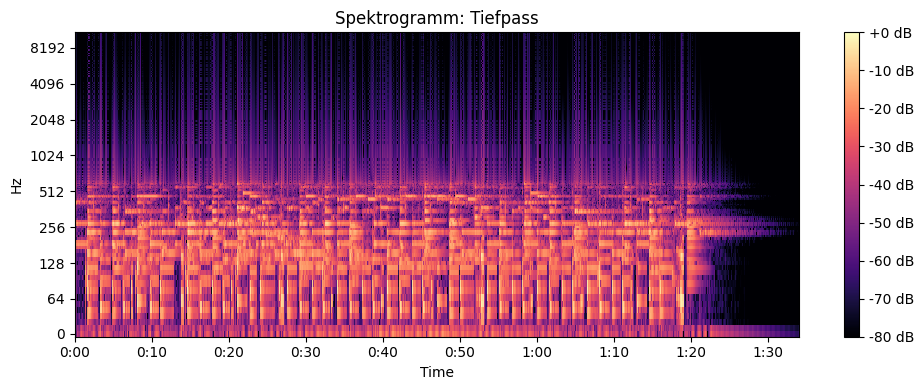

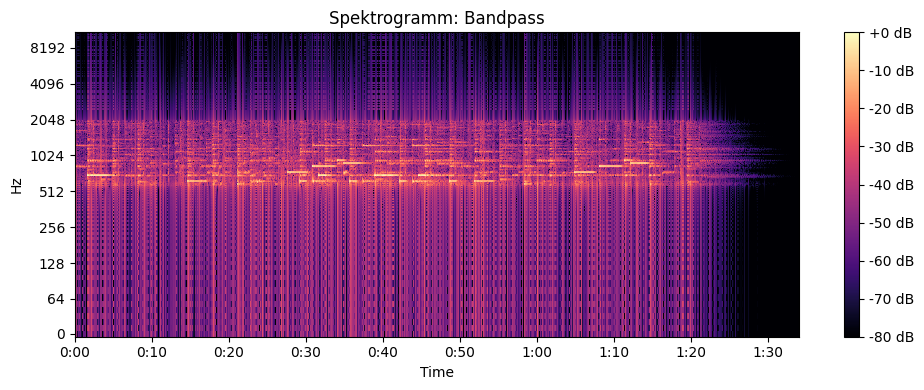

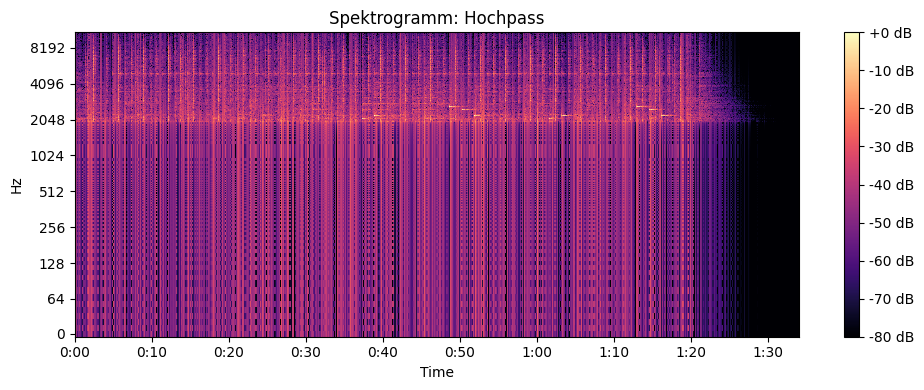

In [41]:
def plot_spectrogram(signal, sr, title):
    D = librosa.amplitude_to_db(np.abs(librosa.stft(signal)), ref=np.max)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

plot_spectrogram(lowpass_signal, sr, "Spektrogramm: Tiefpass")
plot_spectrogram(bandpass_signal, sr, "Spektrogramm: Bandpass")
plot_spectrogram(highpass_signal, sr, "Spektrogramm: Hochpass")


In [42]:
from IPython.display import Audio

# Überprüfen Sie das Ergebnis akustisch durch Abspielen
Audio(lowpass_signal, rate=sr)

In [43]:
Audio(bandpass_signal, rate=sr)

In [44]:
Audio(highpass_signal, rate=sr)